In [76]:
%pip install "numpy>=2.0,<2.3" --force-reinstall

  Using cached numpy-2.2.6-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (62 kB)
Using cached numpy-2.2.6-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (16.5 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 2.2.6
    Uninstalling numpy-2.2.6:
      Successfully uninstalled numpy-2.2.6
Note: you may need to restart the kernel to use updated packages.


In [2]:
# python
import sys
import os
import importlib
# columnar analysis
from coffea import processor
from coffea.nanoevents import NanoEventsFactory, NanoAODSchema
import awkward as ak
from dask.distributed import Client, performance_report
# local

sidm_path = str(os.getcwd()).split("/sidm")[0]
# sidm_path = str(sys.path[0]).split("/sidm")[0]
if sidm_path not in sys.path: sys.path.insert(1, sidm_path)
from sidm.tools import utilities, sidm_processor, scaleout, cutflow
from sidm.tools import llpnanoaodschema
# always reload local modules to pick up changes during development
importlib.reload(utilities)
importlib.reload(sidm_processor)
importlib.reload(scaleout)
# plotting
import matplotlib.pyplot as plt
utilities.set_plot_style()
%matplotlib inline
from tqdm.notebook import tqdm
import coffea.util
import numpy as np
import mplhep as hep
import yaml
from sidm.tools.utilities import plot_MC_sig_vs_bkg_panels
from pathlib import Path

In [3]:
# Load signal sample names from YAML files
yaml_file_path = "../../configs/ntuples/signal_2mu2e_v10.yaml"
with open(yaml_file_path, "r") as file:
    data = yaml.safe_load(file)

signals_2mu2e_all = list(
    data["llpNanoAOD_v2"]["samples"].keys()
)

yaml_file_path = "../../configs/ntuples/signal_4mu_v10.yaml"
with open(yaml_file_path, "r") as file:
    data = yaml.safe_load(file)

signals_4mu_all = list(
    data["llpNanoAOD_v2"]["samples"].keys()
)


# Combine all signal samples
signals_all = signals_2mu2e_all + signals_4mu_all


# Check whether an out dictionary already exists
try:
    out
    print(
        "The out dictionary already exists; "
        "will use what is saved in memory if possible"
    )
except NameError:
    print(
        "WARNING! No processor output stored in memory. "
        "Will load one coffea file for each sample."
    )
    out = {}

input_dir = Path("1LJ_CR_signal_full_merge")


# Load one merged coffea file for each signal point
for sample in signals_all:
    if sample in out:
        print(f"{sample} already found in memory; not loading file")
        continue

    input_file = input_dir / f"{sample}.coffea"
    print(f"Loading {input_file}")

    try:
        output = coffea.util.load(input_file)
    except FileNotFoundError:
        print(f"**** File not found: {input_file}")
        continue
    except Exception as error:
        print(f"**** Failed to load {input_file}: {error}")
        continue

    # Support the possible output structures:
    # output["out"][sample] or output[sample]
    if "out" in output and sample in output["out"]:
        out[sample] = output["out"][sample]
    elif sample in output:
        out[sample] = output[sample]
    else:
        print(
            f"**** Sample '{sample}' was not found inside "
            f"{input_file}"
        )
        print(f"Available top-level keys: {list(output.keys())}")
        continue

    print(f"Successfully loaded {sample}")

WARNING! No processor output stored in memory. Will load one coffea file for each sample.
Loading 1LJ_CR_signal_full_merge/2Mu2E_100GeV_0p25GeV_0p02mm.coffea
Successfully loaded 2Mu2E_100GeV_0p25GeV_0p02mm
Loading 1LJ_CR_signal_full_merge/2Mu2E_100GeV_0p25GeV_0p2mm.coffea
Successfully loaded 2Mu2E_100GeV_0p25GeV_0p2mm
Loading 1LJ_CR_signal_full_merge/2Mu2E_100GeV_0p25GeV_2p0mm.coffea
Successfully loaded 2Mu2E_100GeV_0p25GeV_2p0mm
Loading 1LJ_CR_signal_full_merge/2Mu2E_100GeV_0p25GeV_10p0mm.coffea
Successfully loaded 2Mu2E_100GeV_0p25GeV_10p0mm
Loading 1LJ_CR_signal_full_merge/2Mu2E_100GeV_0p25GeV_20p0mm.coffea
Successfully loaded 2Mu2E_100GeV_0p25GeV_20p0mm
Loading 1LJ_CR_signal_full_merge/2Mu2E_100GeV_1p2GeV_0p096mm.coffea
Successfully loaded 2Mu2E_100GeV_1p2GeV_0p096mm
Loading 1LJ_CR_signal_full_merge/2Mu2E_100GeV_1p2GeV_0p96mm.coffea
Successfully loaded 2Mu2E_100GeV_1p2GeV_0p96mm
Loading 1LJ_CR_signal_full_merge/2Mu2E_100GeV_1p2GeV_9p6mm.coffea
Successfully loaded 2Mu2E_100GeV_1p2Ge

In [4]:
samples_bkg = [
    "TTJets",
    "QCD_Pt15To20",
    "QCD_Pt20To30",
    "QCD_Pt30To50",
    "QCD_Pt50To80",
    "QCD_Pt80To120", 
    "QCD_Pt120To170",
    "QCD_Pt170To300", 
    "QCD_Pt300To470",
    "QCD_Pt470To600", 
    "QCD_Pt600To800", 
    "QCD_Pt800To1000",
    "QCD_Pt1000", 
    "DYJetsToLL_M10to50",
    "DYJetsToLL_M50", 
    "WW",
    "WZ",
    "ZZ",
]

In [5]:
#First check if there is already an out dictionary
try:
    out
    print("The _out_ dictionary already exists; will use what is saved in memory if possible")
except NameError:
    print("WARNING! No processor output stored in the kernel's memory. Will try to load pickled coffea file for each sample instead")
    out = {}

#For each sample, try to use the data in memory if possible; if not try to load the file
#If those both fail, then raise an error and skip it
for sample in samples_bkg:
    if sample in out:
        print(f"{sample} already found in memory; not loading file")
    else:
        print(f"Loading file for sample {sample}")
        filename = sample + ".coffea"
        try: 
            output = coffea.util.load("1LJ_CR_bkg_full_merge/"+filename)
            print("Successfully opened file")        
            out[sample] = output["out"][sample]
            # out[sample] = output["out"][sample.removesuffix("_part1")]
        except Exception:
            out[sample] = output[sample]
            # print("**** ERROR! File not found. Check the file name, or run the processor again and save the output to a pickle file using coffea.util.save")

The _out_ dictionary already exists; will use what is saved in memory if possible
Loading file for sample TTJets
Successfully opened file
Loading file for sample QCD_Pt15To20
Successfully opened file
Loading file for sample QCD_Pt20To30
Successfully opened file
Loading file for sample QCD_Pt30To50
Successfully opened file
Loading file for sample QCD_Pt50To80
Successfully opened file
Loading file for sample QCD_Pt80To120
Successfully opened file
Loading file for sample QCD_Pt120To170
Successfully opened file
Loading file for sample QCD_Pt170To300
Successfully opened file
Loading file for sample QCD_Pt300To470
Successfully opened file
Loading file for sample QCD_Pt470To600
Successfully opened file
Loading file for sample QCD_Pt600To800
Successfully opened file
Loading file for sample QCD_Pt800To1000
Successfully opened file
Loading file for sample QCD_Pt1000
Successfully opened file
Loading file for sample DYJetsToLL_M10to50
Successfully opened file
Loading file for sample DYJetsToLL_M50

In [24]:
channel_1mu = [
    "data_control_region_1muLj",
]

In [7]:
map_2mu2e = {
    100: [
        "2Mu2E_100GeV_0p25GeV_0p02mm",
        "2Mu2E_100GeV_0p25GeV_20p0mm",
        "2Mu2E_100GeV_1p2GeV_0p096mm",
        "2Mu2E_100GeV_1p2GeV_96p0mm",
        "2Mu2E_100GeV_5p0GeV_0p4mm",
        "2Mu2E_100GeV_5p0GeV_400mm",
    ],
    150: [
        "2Mu2E_150GeV_0p25GeV_0p013mm",
        "2Mu2E_150GeV_0p25GeV_13p0mm",
        "2Mu2E_150GeV_1p2GeV_0p064mm",
        "2Mu2E_150GeV_1p2GeV_64p0mm",
        "2Mu2E_150GeV_5p0GeV_0p27mm",
        "2Mu2E_150GeV_5p0GeV_270p0mm",
    ],
    200: [
        "2Mu2E_200GeV_0p25GeV_0p01mm",
        "2Mu2E_200GeV_0p25GeV_10p0mm",
        "2Mu2E_200GeV_1p2GeV_0p048mm",
        "2Mu2E_200GeV_1p2GeV_48p0mm",
        "2Mu2E_200GeV_5p0GeV_0p2mm",
        "2Mu2E_200GeV_5p0GeV_200p0mm",
    ],
    500: [
        "2Mu2E_500GeV_0p25GeV_0p004mm",
        "2Mu2E_500GeV_0p25GeV_4p0mm",
        "2Mu2E_500GeV_1p2GeV_0p019mm",
        "2Mu2E_500GeV_1p2GeV_19p0mm",
        "2Mu2E_500GeV_5p0GeV_0p08mm",
        "2Mu2E_500GeV_5p0GeV_80p0mm",
    ],
    800: [
        "2Mu2E_800GeV_0p25GeV_0p0025mm",
        "2Mu2E_800GeV_0p25GeV_2p5mm",
        "2Mu2E_800GeV_1p2GeV_0p012mm",
        "2Mu2E_800GeV_1p2GeV_12p0mm",
        "2Mu2E_800GeV_5p0GeV_0p05mm",
        "2Mu2E_800GeV_5p0GeV_50p0mm",
    ],
    1000: [
        "2Mu2E_1000GeV_0p25GeV_0p002mm",
        "2Mu2E_1000GeV_0p25GeV_2p0mm",
        "2Mu2E_1000GeV_1p2GeV_0p0096mm",
        "2Mu2E_1000GeV_1p2GeV_9p6mm",
        "2Mu2E_1000GeV_5p0GeV_0p04mm",
        "2Mu2E_1000GeV_5p0GeV_40p0mm",
    ],
}

map_4mu = {
    100: [
        "4Mu_100GeV_0p25GeV_0p02mm",
        "4Mu_100GeV_0p25GeV_20p0mm",
        "4Mu_100GeV_1p2GeV_0p096mm",
        "4Mu_100GeV_1p2GeV_96p0mm",
        "4Mu_100GeV_5p0GeV_0p4mm",
        "4Mu_100GeV_5p0GeV_400mm",
    ],
    150: [
        "4Mu_150GeV_0p25GeV_0p013mm",
        "4Mu_150GeV_0p25GeV_13p0mm",
        "4Mu_150GeV_1p2GeV_0p064mm",
        "4Mu_150GeV_1p2GeV_64p0mm",
        "4Mu_150GeV_5p0GeV_0p27mm",
        "4Mu_150GeV_5p0GeV_270p0mm",
    ],
    200: [
        "4Mu_200GeV_0p25GeV_0p01mm",
        "4Mu_200GeV_0p25GeV_10p0mm",
        "4Mu_200GeV_1p2GeV_0p048mm",
        "4Mu_200GeV_1p2GeV_48p0mm",
        "4Mu_200GeV_5p0GeV_0p2mm",
        "4Mu_200GeV_5p0GeV_200p0mm",
    ],
    500: [
        "4Mu_500GeV_0p25GeV_0p004mm",
        "4Mu_500GeV_0p25GeV_4p0mm",
        "4Mu_500GeV_1p2GeV_0p019mm",
        "4Mu_500GeV_1p2GeV_19p0mm",
        "4Mu_500GeV_5p0GeV_0p08mm",
        "4Mu_500GeV_5p0GeV_80p0mm",
    ],
    800: [
        "4Mu_800GeV_0p25GeV_0p0025mm",
        "4Mu_800GeV_0p25GeV_2p5mm",
        "4Mu_800GeV_1p2GeV_0p012mm",
        "4Mu_800GeV_1p2GeV_12p0mm",
        "4Mu_800GeV_5p0GeV_0p05mm",
        "4Mu_800GeV_5p0GeV_50p0mm",
    ],
    1000: [
        "4Mu_1000GeV_0p25GeV_0p002mm",
        "4Mu_1000GeV_0p25GeV_2p0mm",
        "4Mu_1000GeV_1p2GeV_0p0096mm",
        "4Mu_1000GeV_1p2GeV_9p6mm",
        "4Mu_1000GeV_5p0GeV_0p04mm",
        "4Mu_1000GeV_5p0GeV_40p0mm",
    ],
}

In [13]:
QCD = [
    "QCD_Pt15To20",
    "QCD_Pt20To30",
    "QCD_Pt30To50",
    "QCD_Pt50To80",
    "QCD_Pt80To120",
    "QCD_Pt120To170",
    "QCD_Pt170To300",
    "QCD_Pt300To470",
    "QCD_Pt470To600",
    "QCD_Pt600To800",
    "QCD_Pt800To1000",
    "QCD_Pt1000",
]

DY = [
    "DYJetsToLL_M10to50",
    "DYJetsToLL_M50",
]

TT = ["TTJets"]

Diboson = [
    "WW",
    "WZ",
    "ZZ"]

In [16]:
backgrounds = {
    "Diboson": Diboson,
    "TT": TT,
    "DY": DY,
    "QCD": QCD,
}

background_colors = {
    "Diboson": "#717581",
    "TT": "#3f90da",
    "DY": "#b9ac70",
    "QCD": "#832db6",
}

signal_maps = {
    "2Mu2E": map_2mu2e,
    "4Mu": map_4mu,
}

signal_colors = ["r", "orange", "yellow", "lime", "cyan", "magenta"]

signal_linestyles = {
    "2Mu2E": "-",
    "4Mu": ":",
}

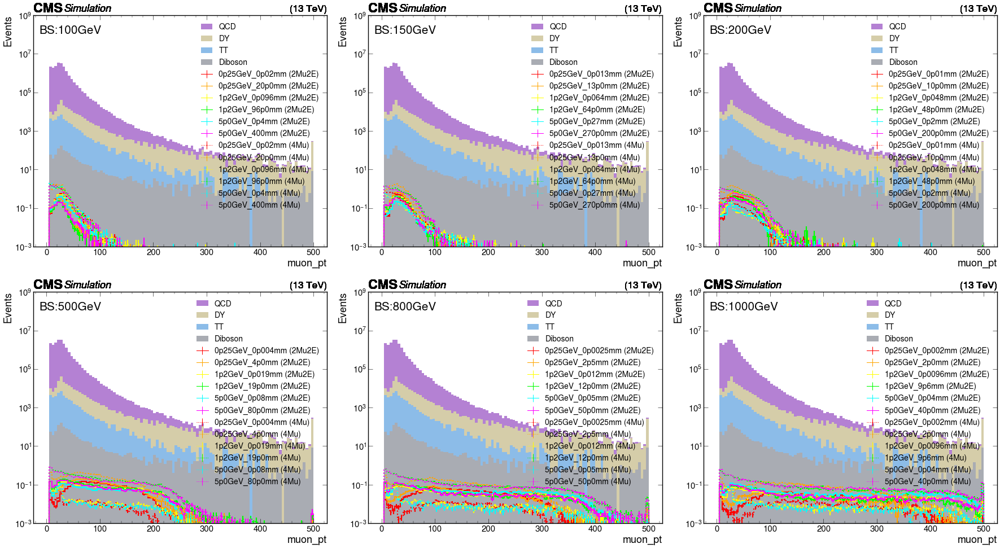

In [25]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="muon_pt",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

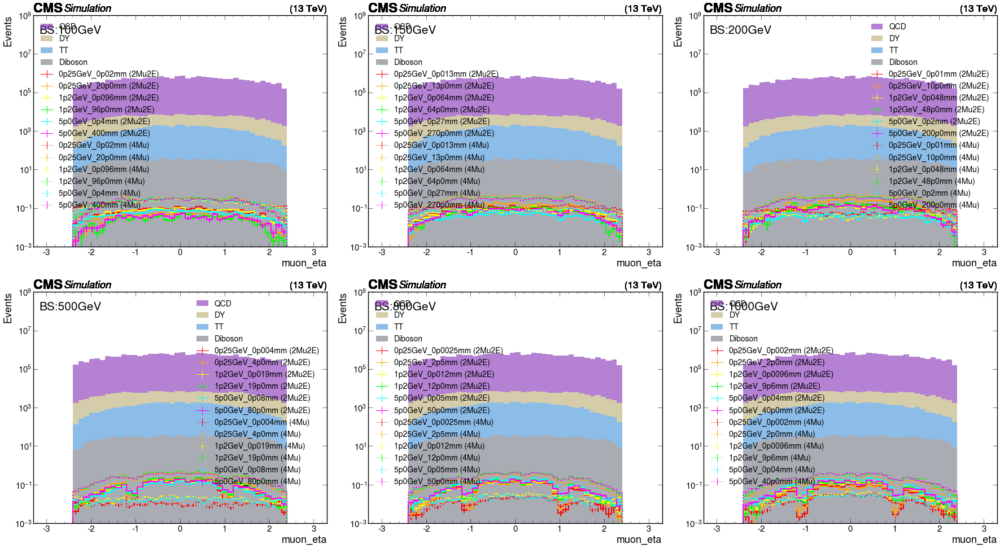

In [26]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="muon_eta",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
    xlabel="muon_eta"
)

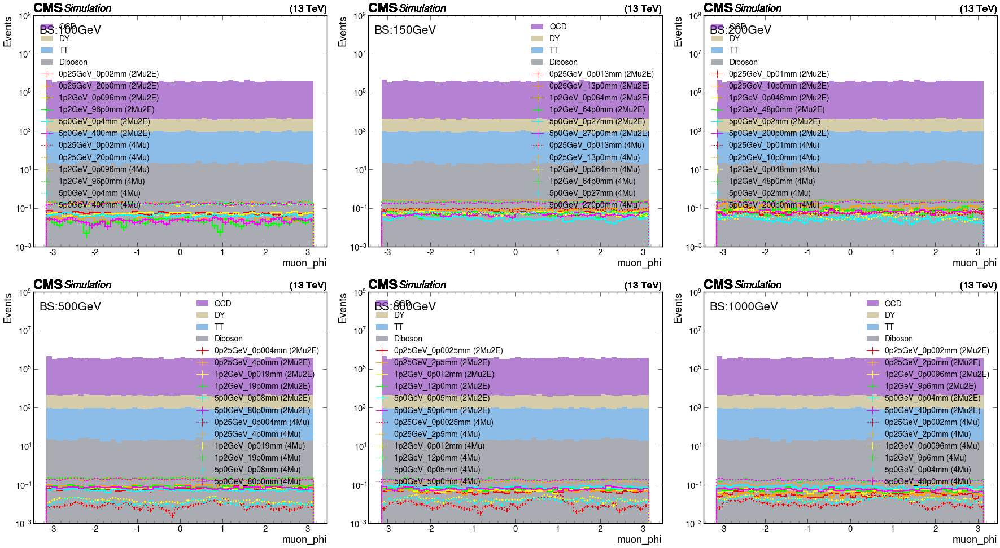

In [27]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="muon_phi",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
    xlabel="muon_phi"
)

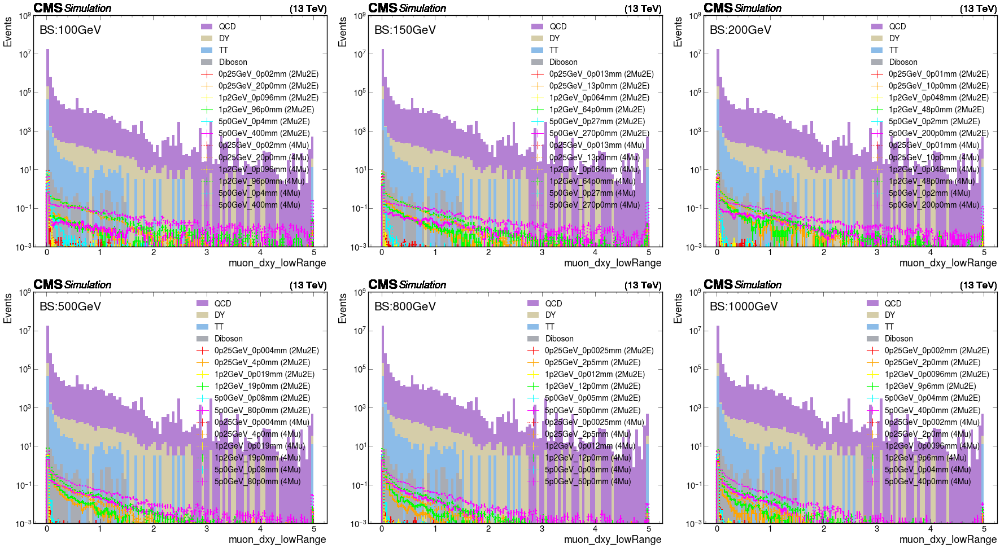

In [28]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="muon_dxy_lowRange",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

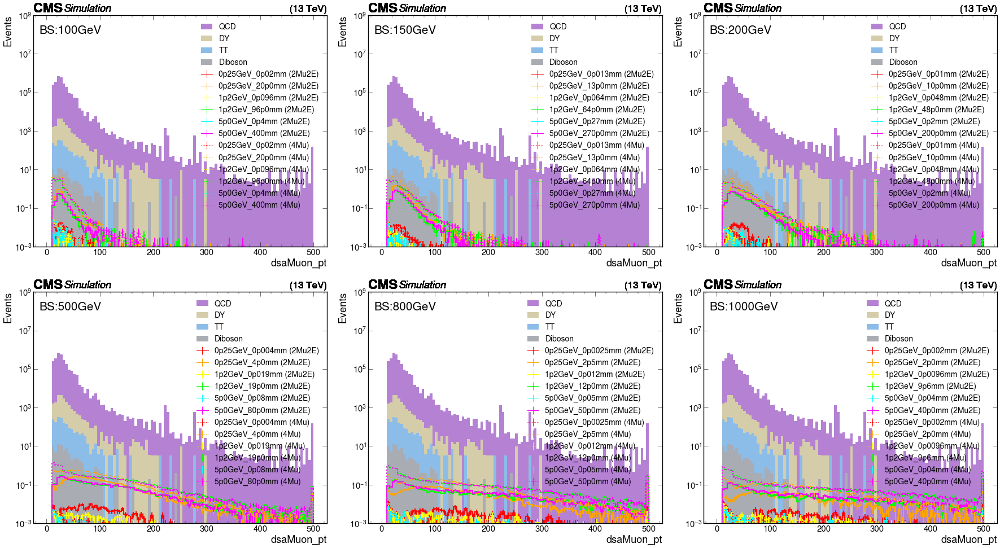

In [29]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="dsaMuon_pt",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

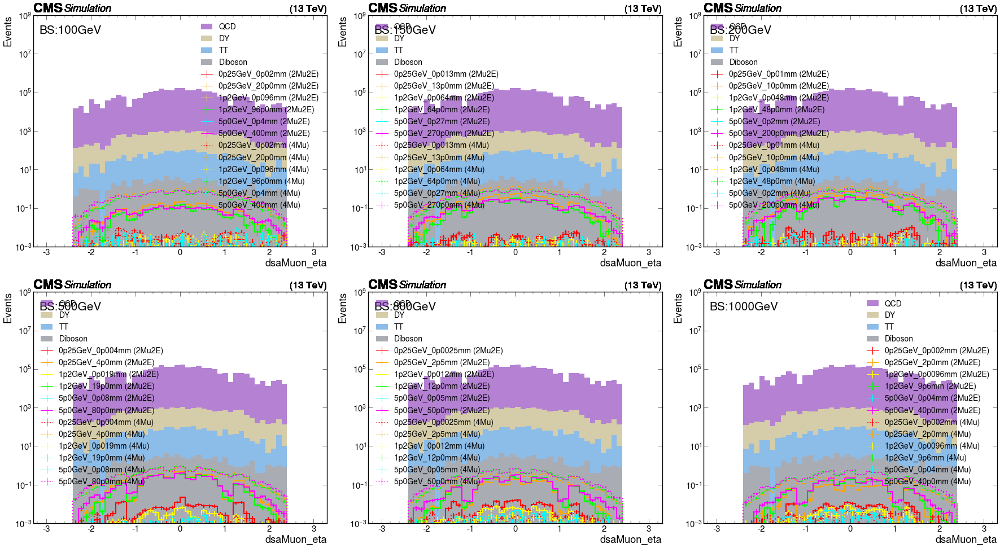

In [30]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="dsaMuon_eta",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
    xlabel="dsaMuon_eta"
)

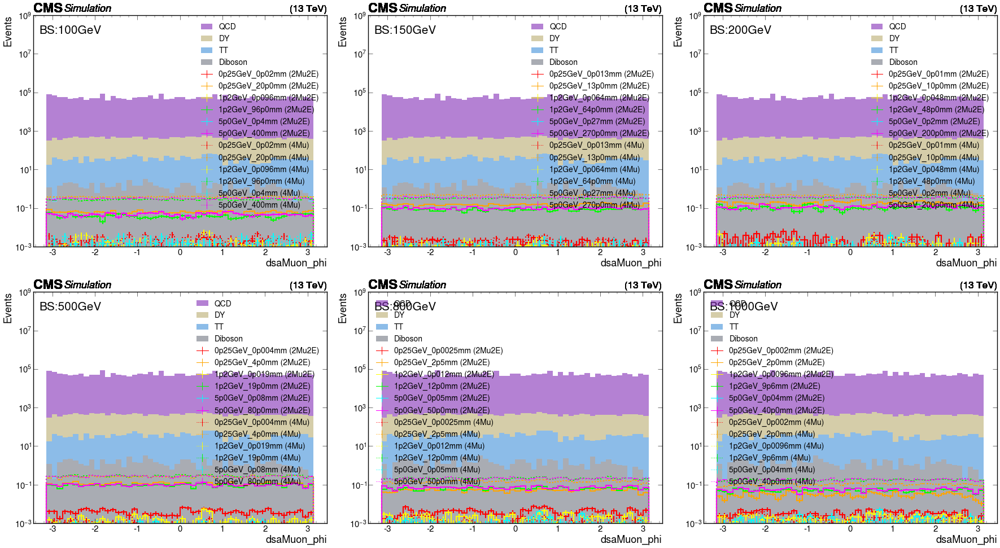

In [31]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="dsaMuon_phi",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
    xlabel="dsaMuon_phi"
)

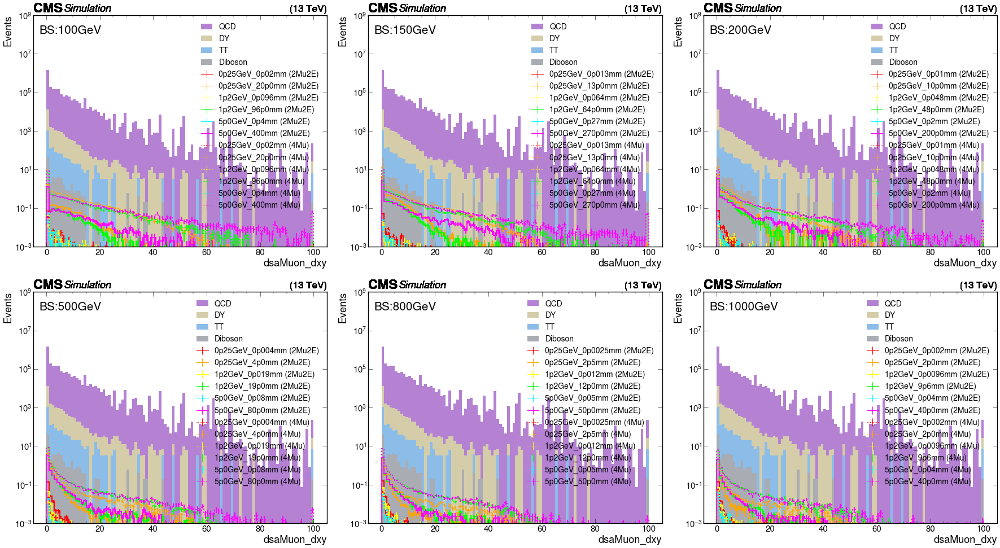

In [32]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="dsaMuon_dxy",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

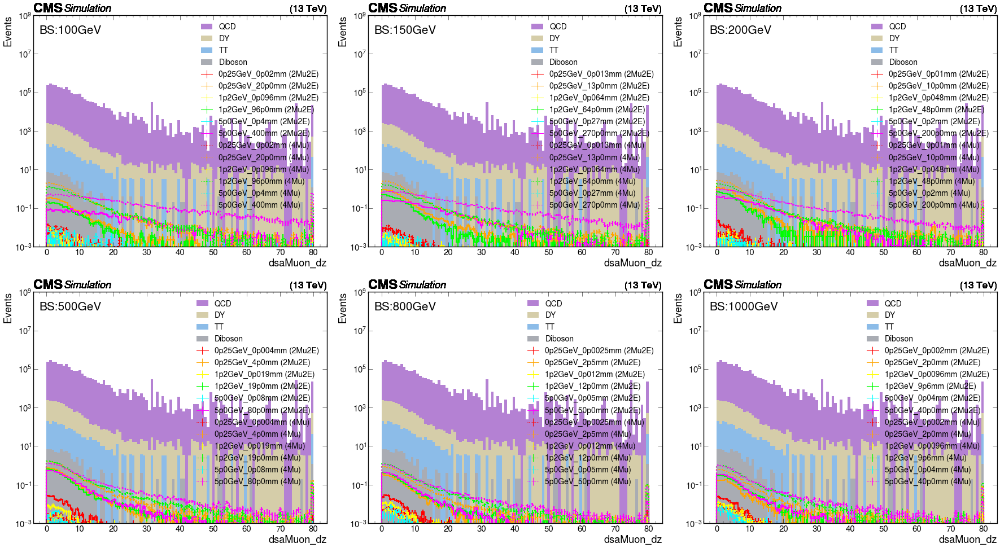

In [33]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="dsaMuon_dz",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)


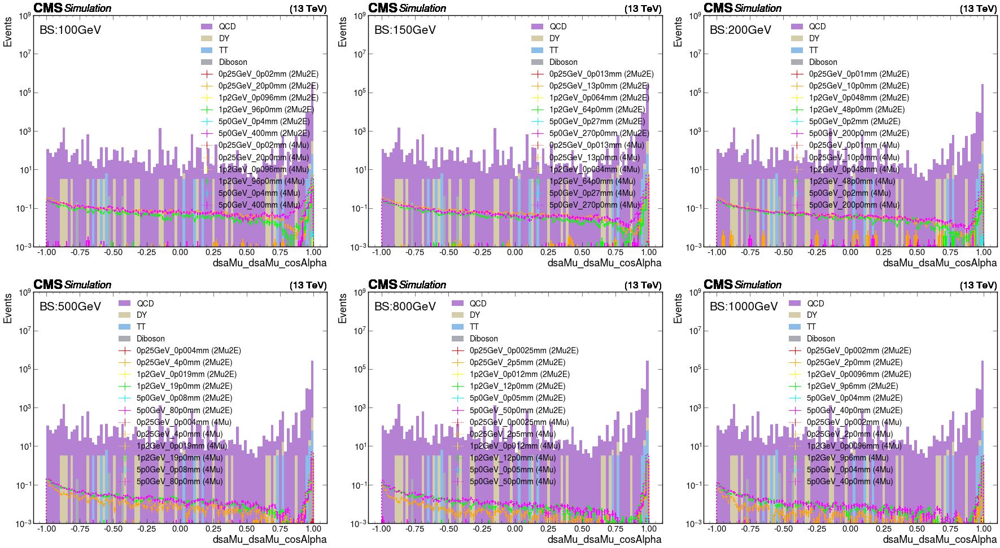

In [34]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="dsaMu_dsaMu_cosAlpha",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

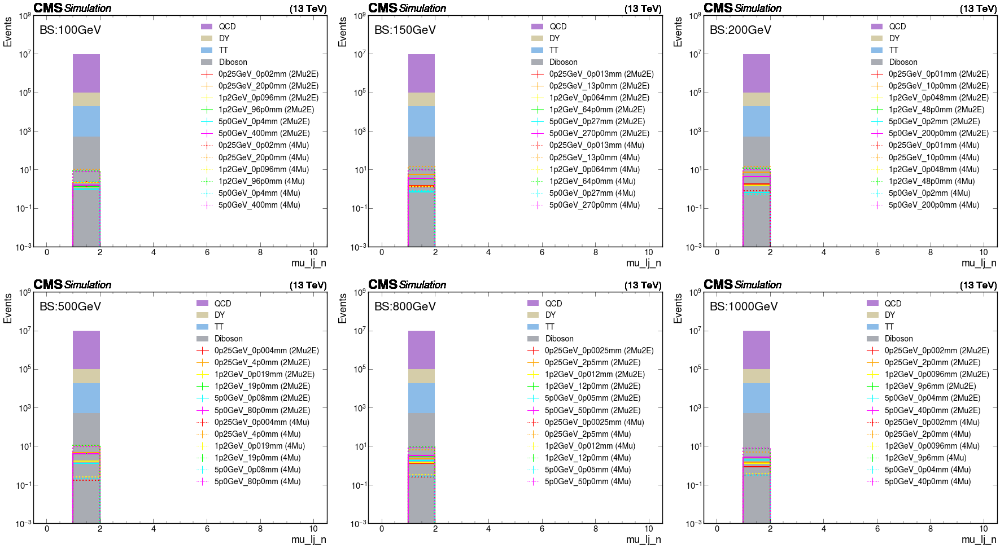

In [35]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="mu_lj_n",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

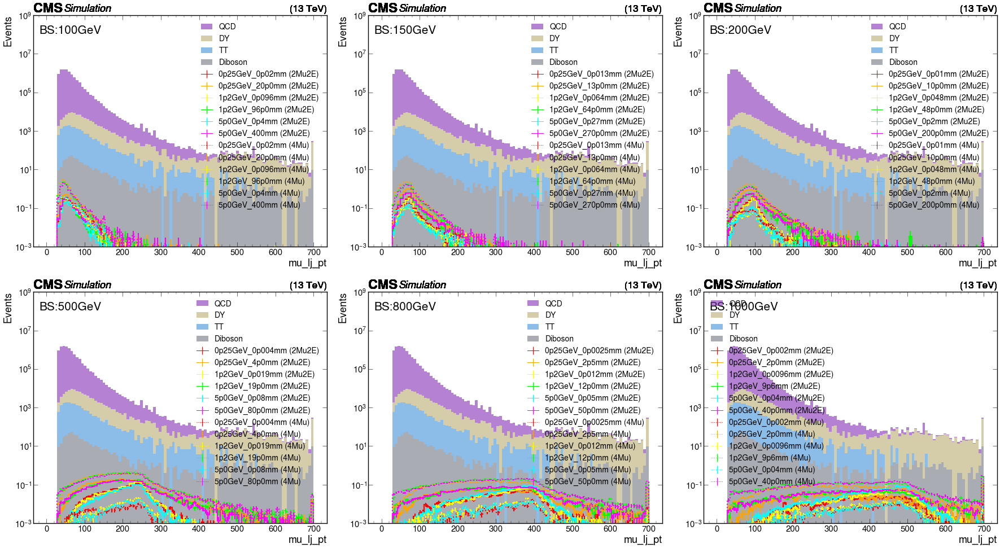

In [36]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="mu_lj_pt",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

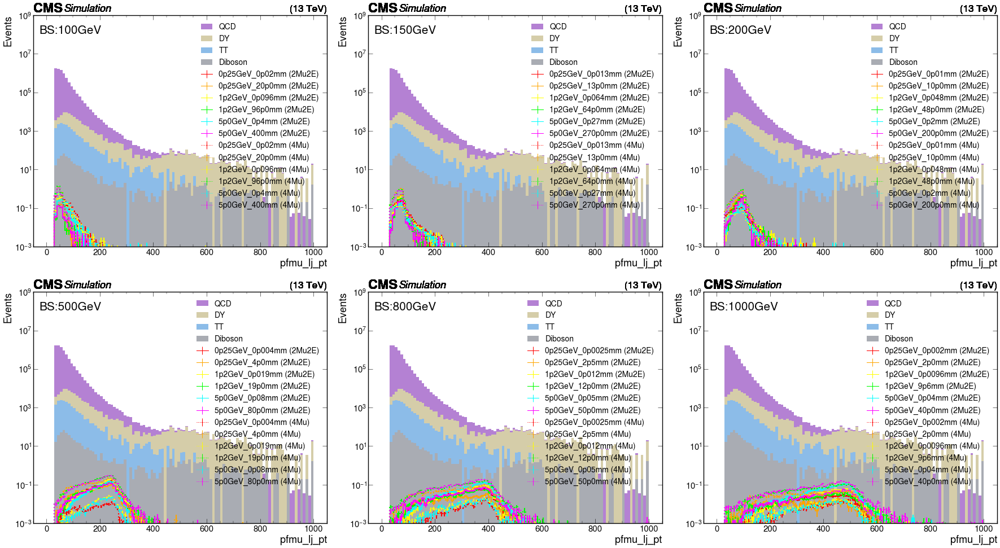

In [37]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="pfmu_lj_pt",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)


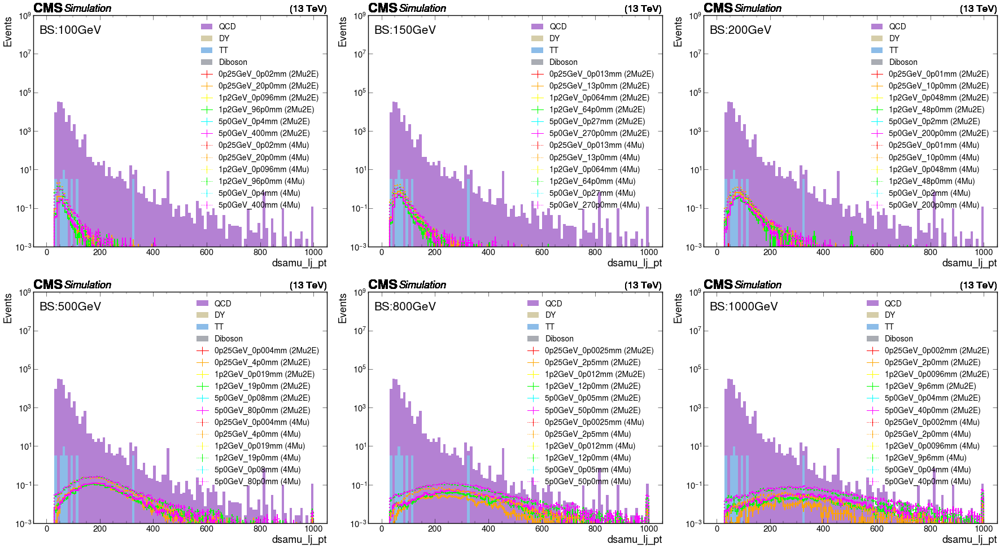

In [38]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="dsamu_lj_pt",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

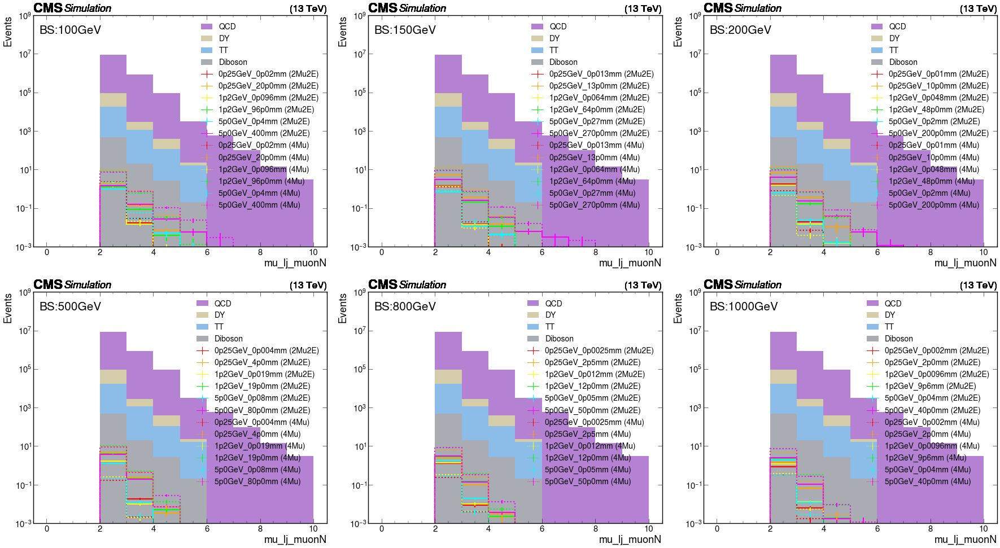

In [39]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="mu_lj_muonN",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

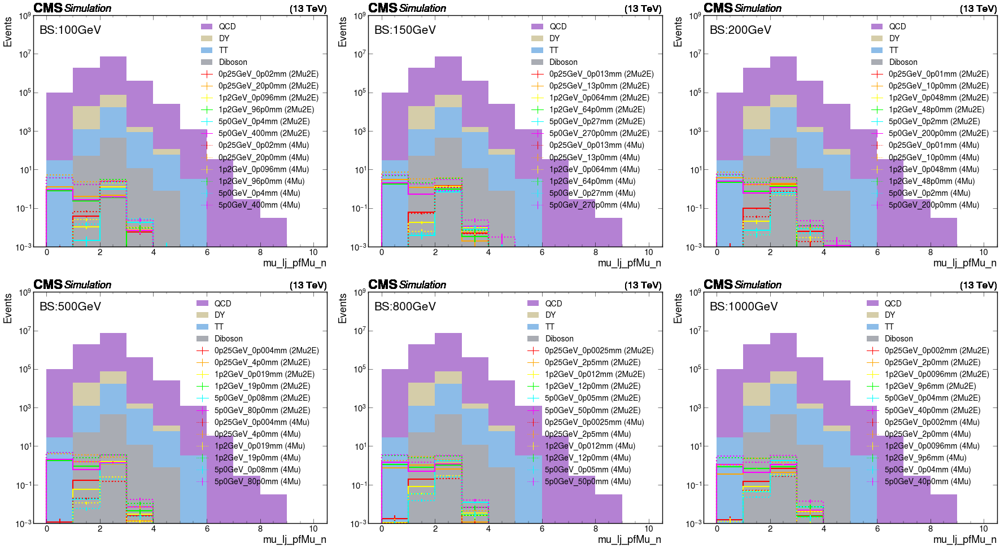

In [40]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="mu_lj_pfMu_n",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

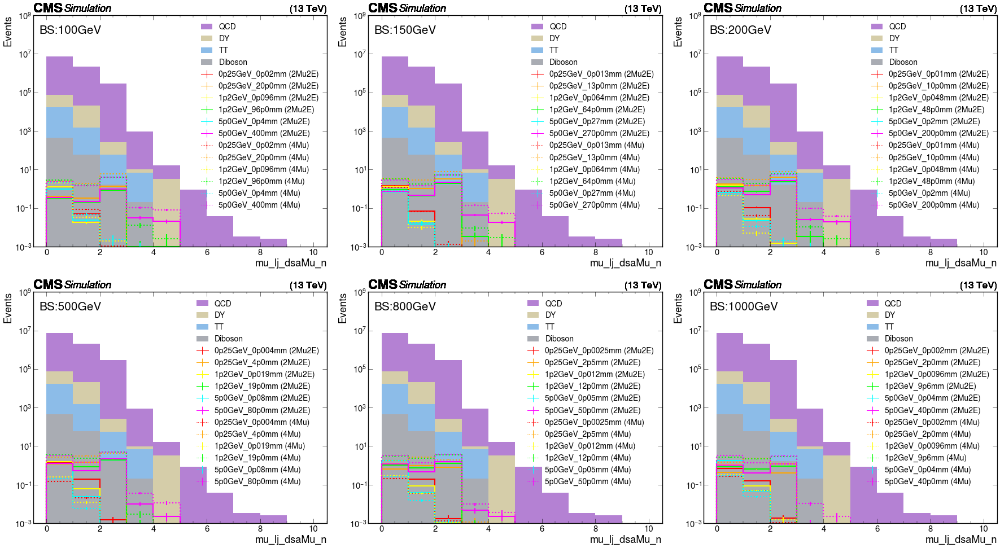

In [41]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="mu_lj_dsaMu_n",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

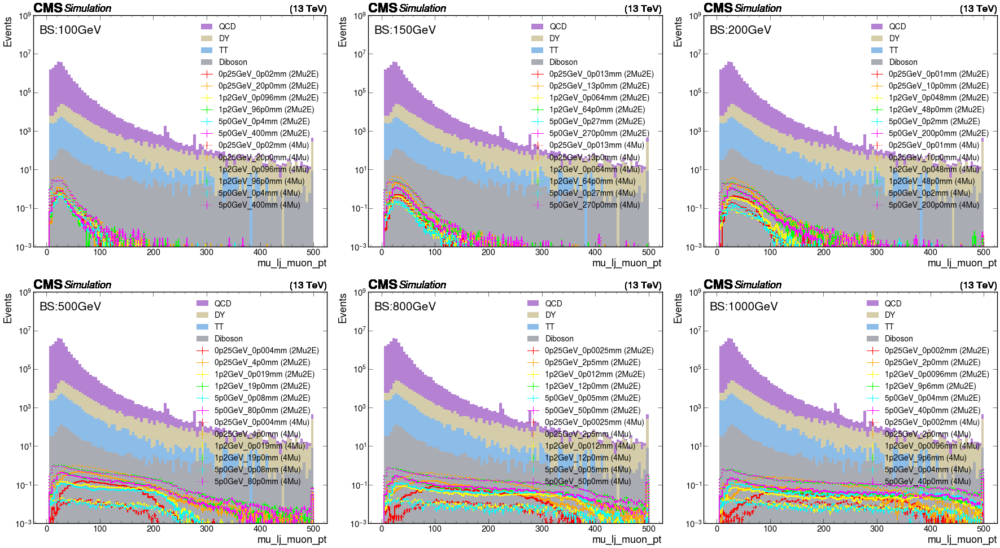

In [42]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="mu_lj_muon_pt",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

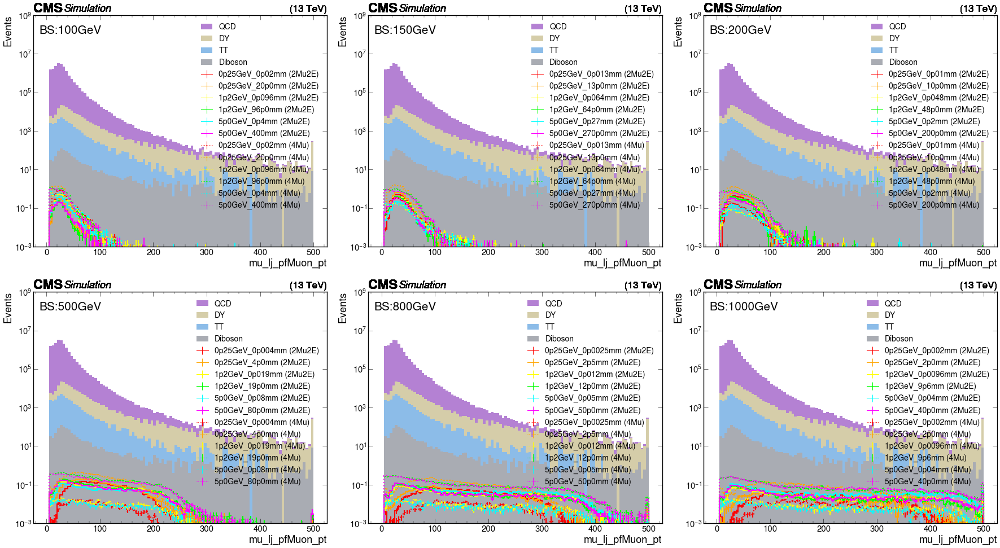

In [43]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="mu_lj_pfMuon_pt",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

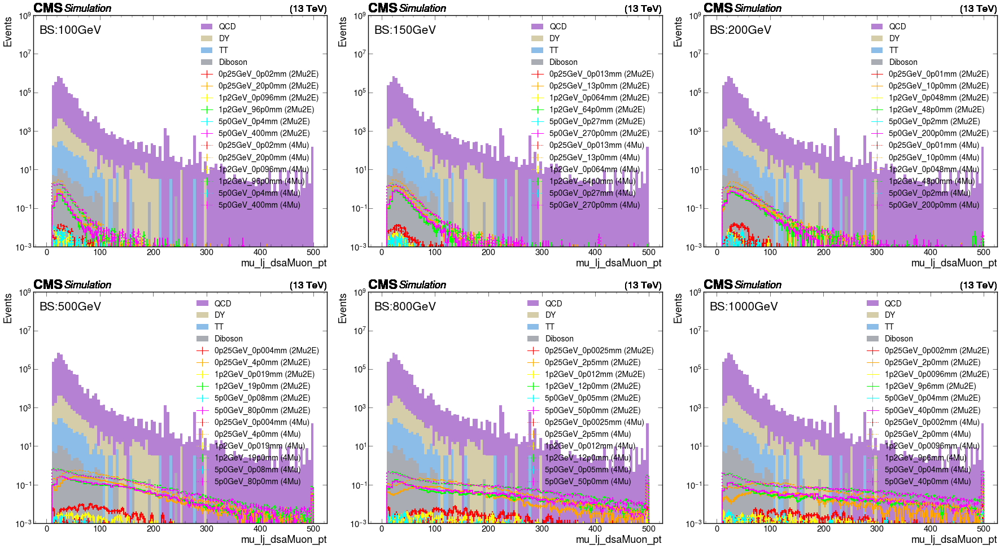

In [44]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="mu_lj_dsaMuon_pt",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

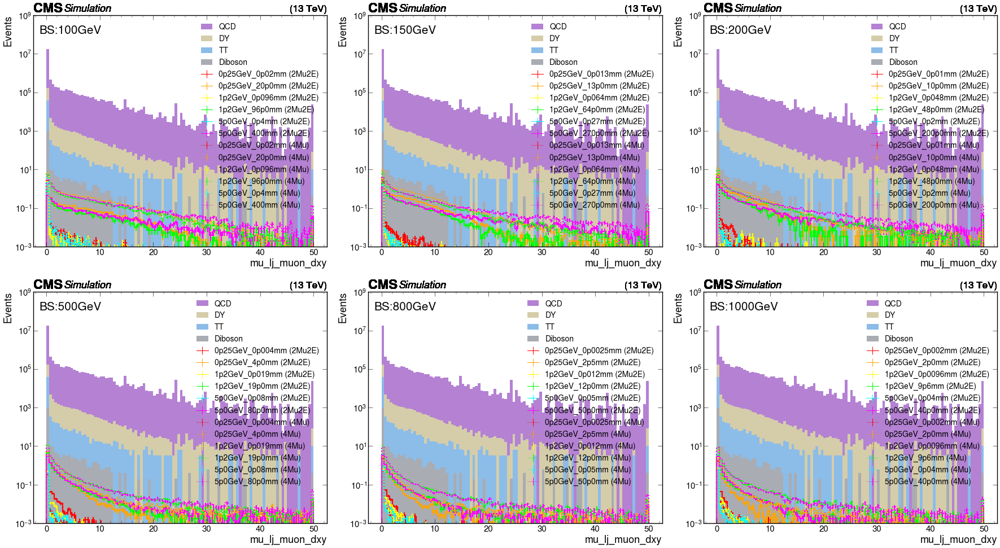

In [45]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="mu_lj_muon_dxy",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

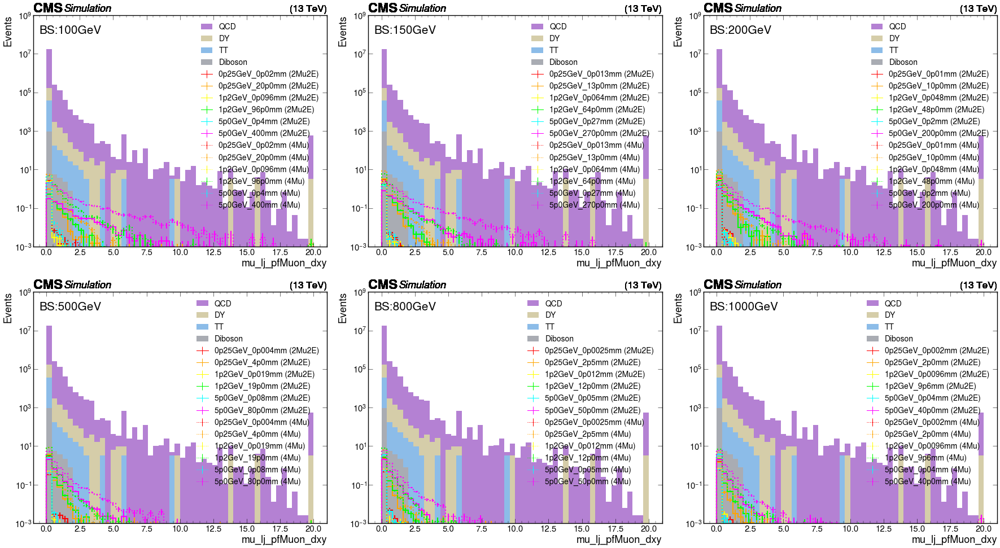

In [46]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="mu_lj_pfMuon_dxy",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

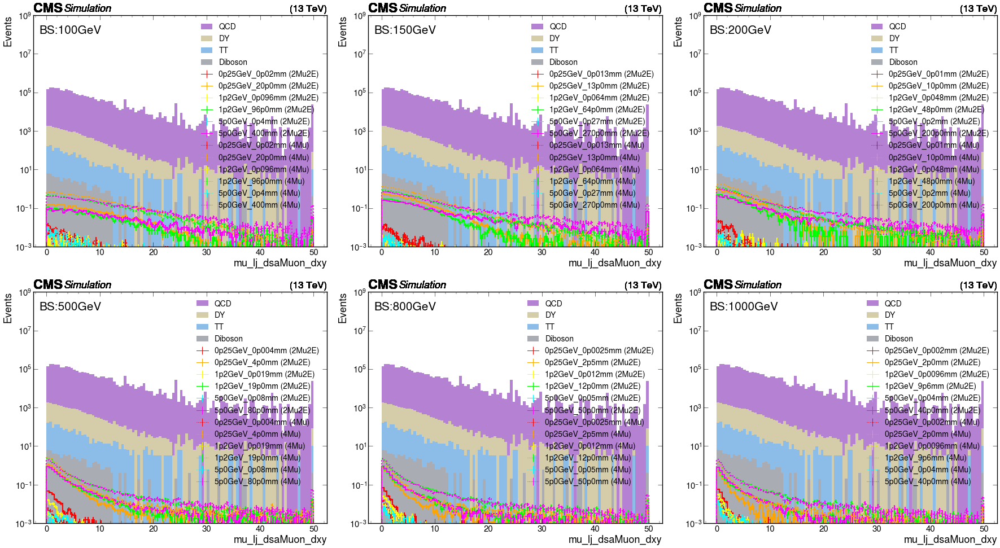

In [47]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="mu_lj_dsaMuon_dxy",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

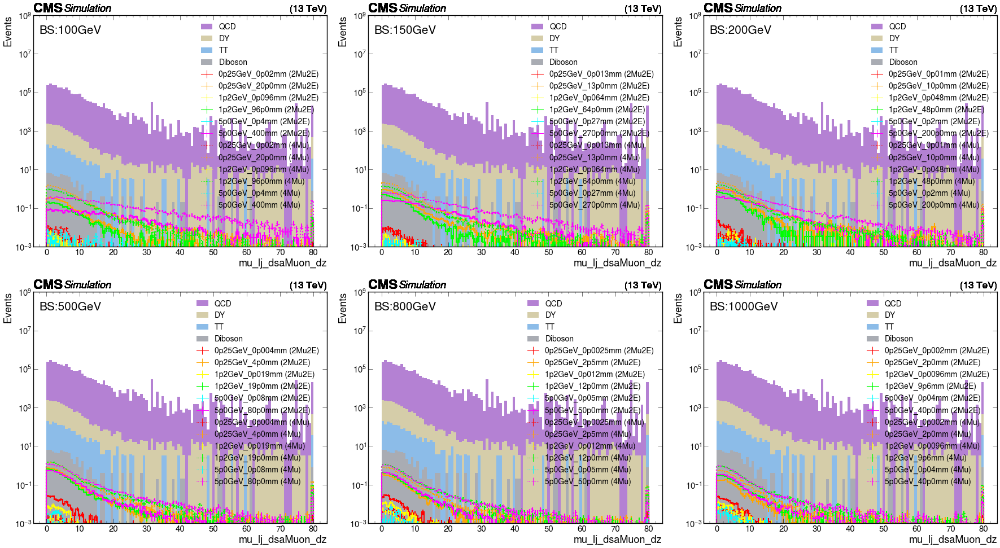

In [48]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="mu_lj_dsaMuon_dz",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

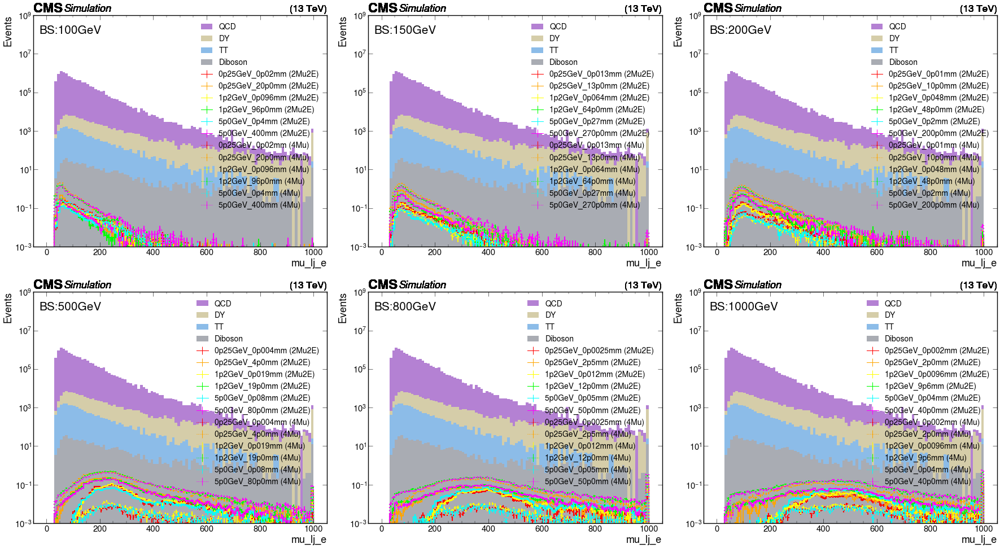

In [49]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="mu_lj_e",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

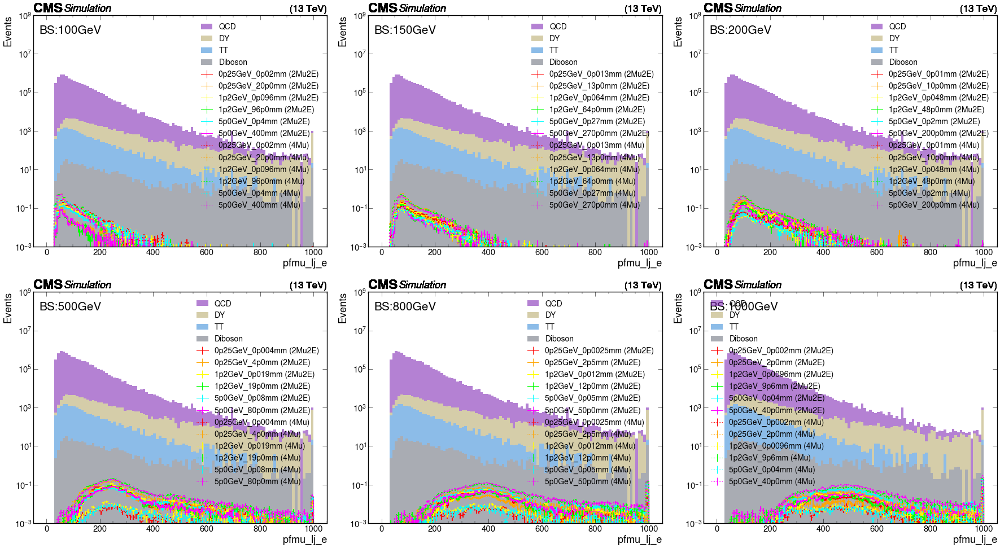

In [50]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="pfmu_lj_e",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)


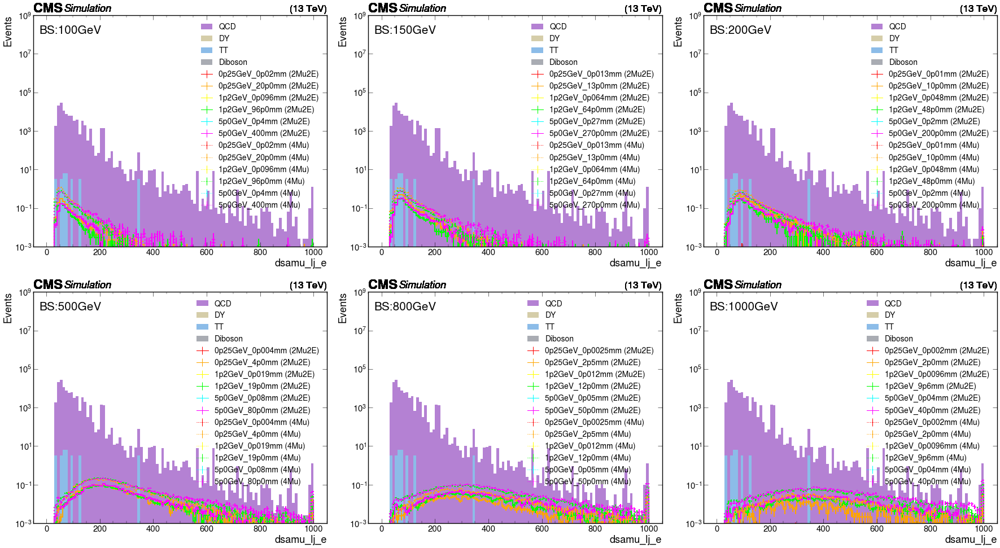

In [51]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="dsamu_lj_e",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

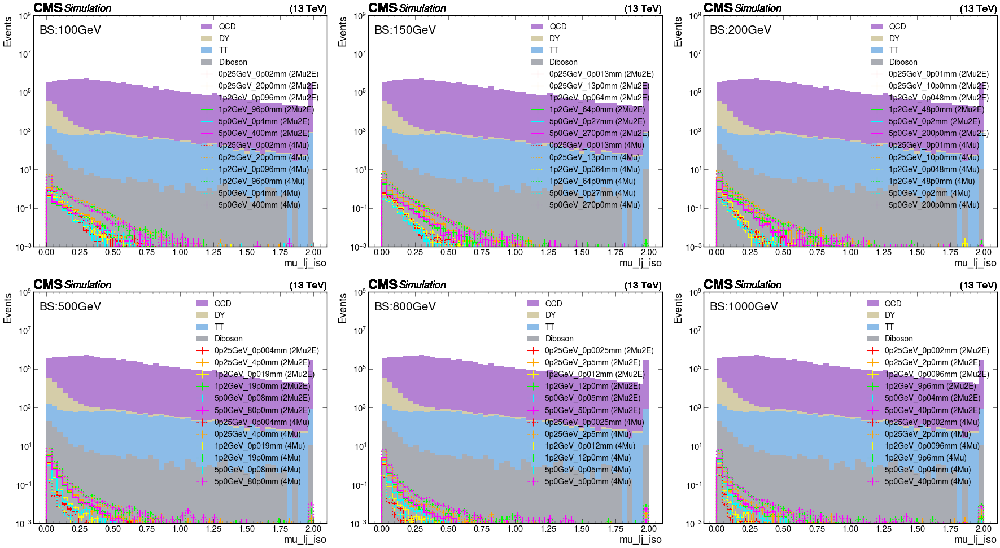

In [52]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="mu_lj_iso",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

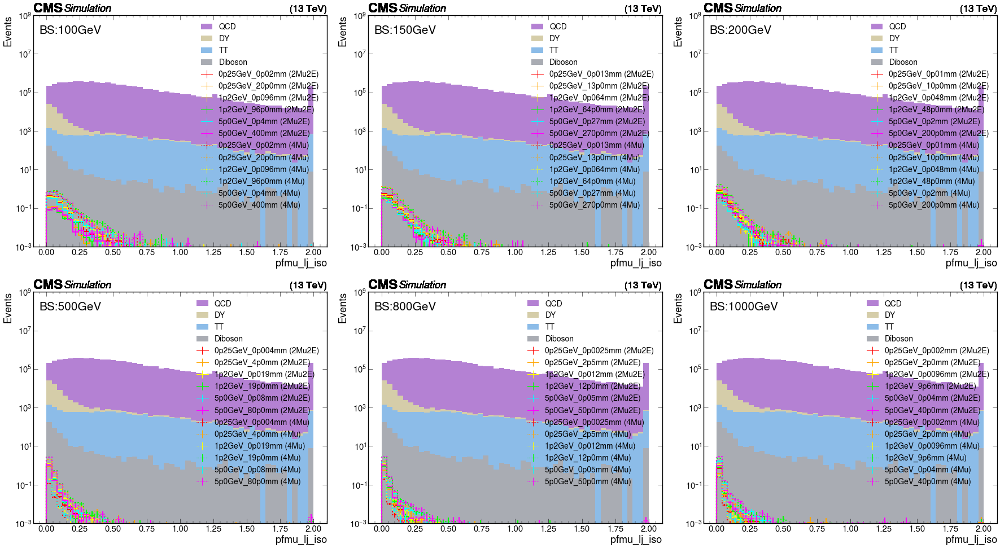

In [54]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="pfmu_lj_iso",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)


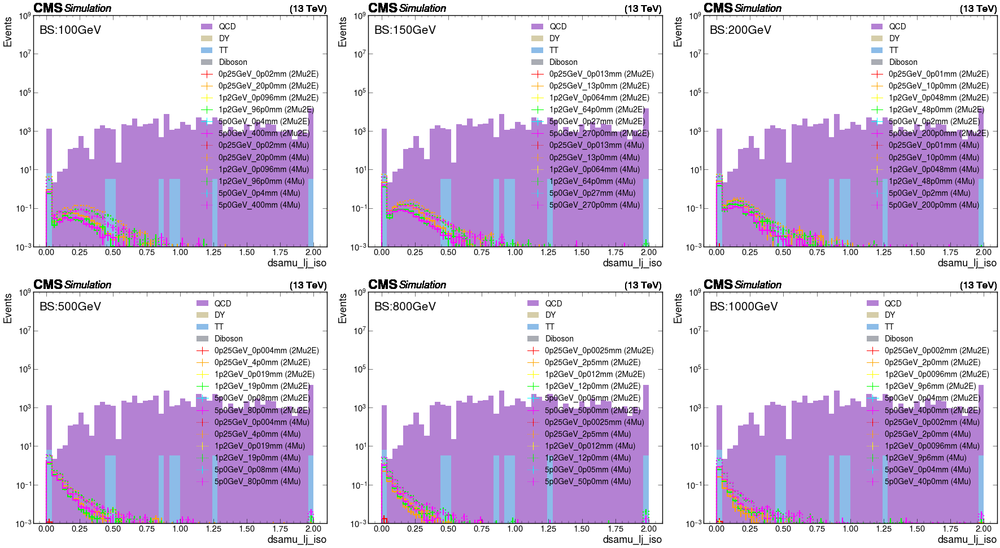

In [55]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="dsamu_lj_iso",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

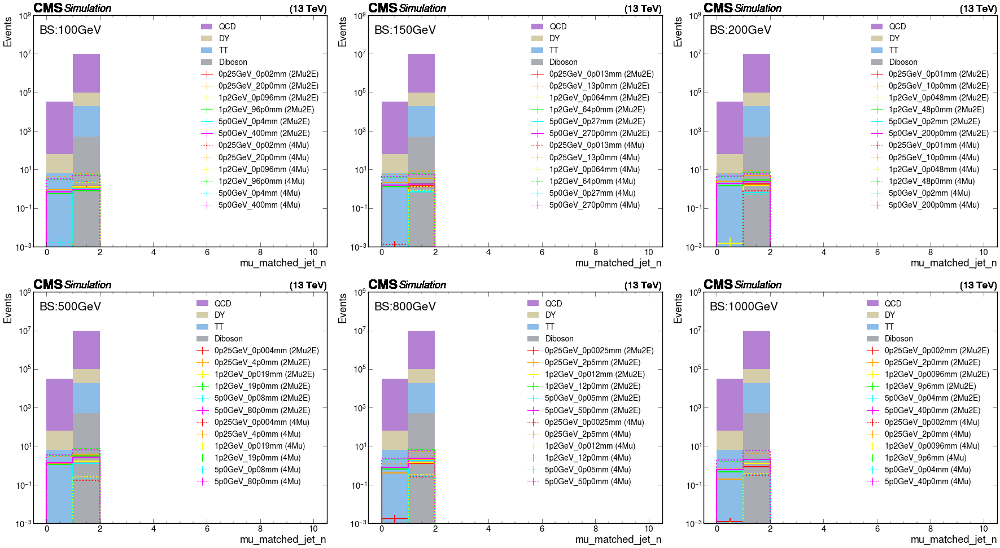

In [56]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="mu_matched_jet_n",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

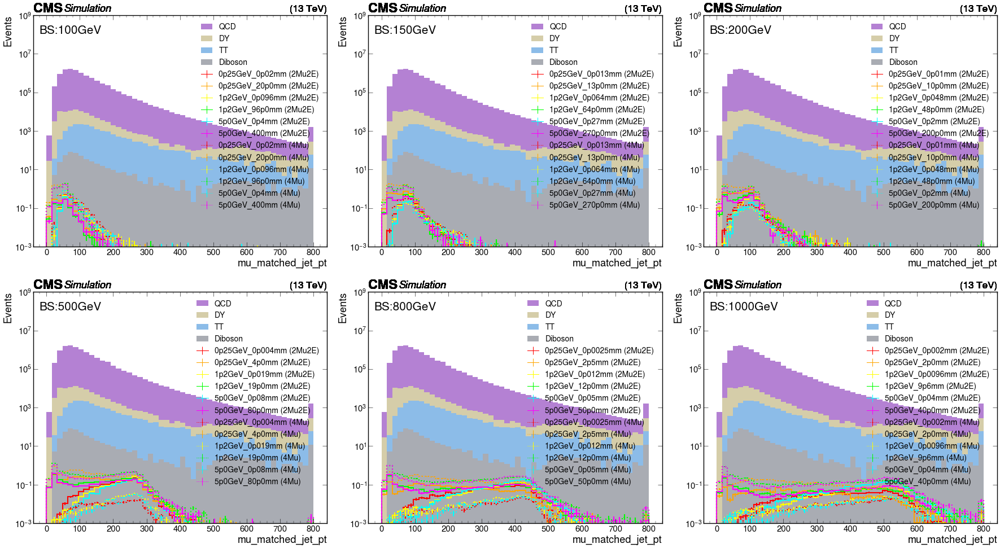

In [57]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="mu_matched_jet_pt",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

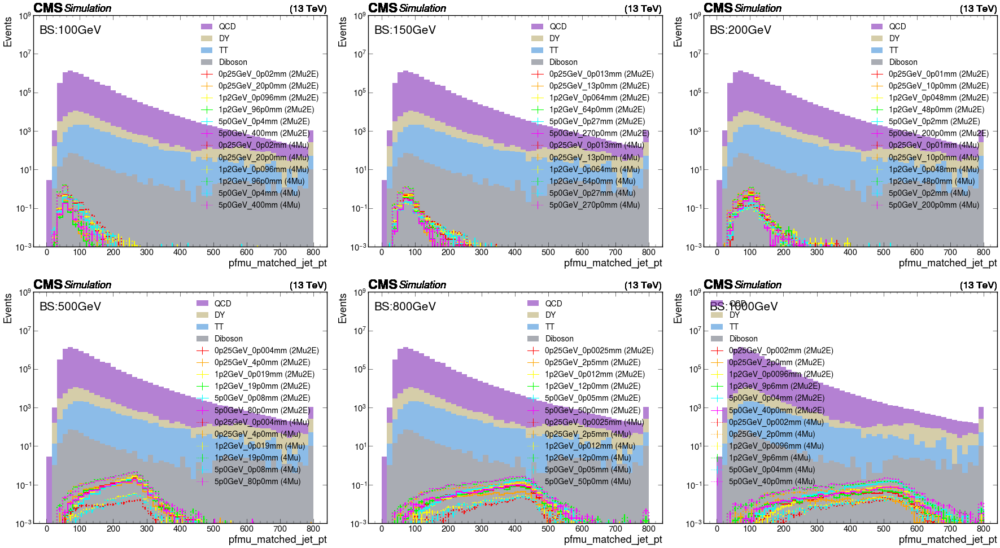

In [58]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="pfmu_matched_jet_pt",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)


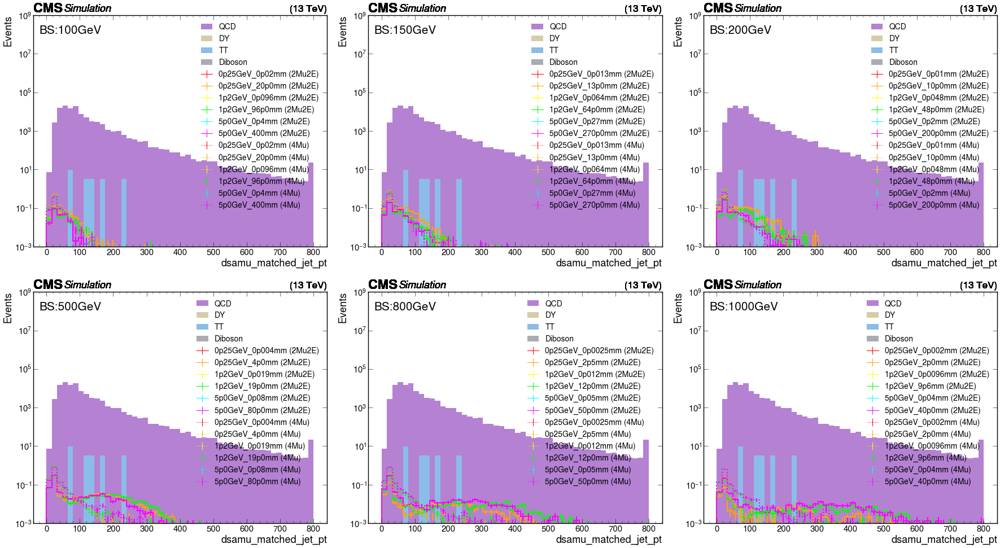

In [59]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="dsamu_matched_jet_pt",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

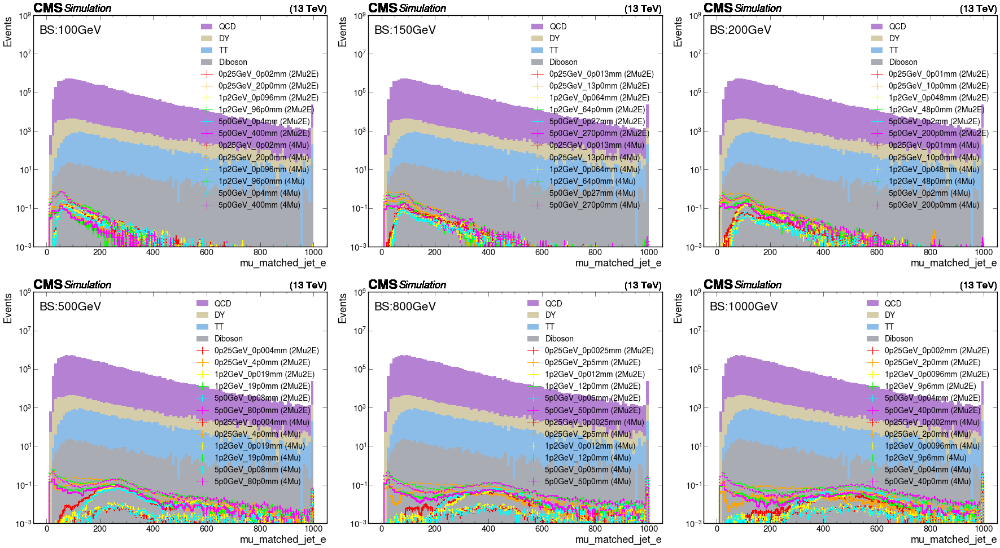

In [60]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="mu_matched_jet_e",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

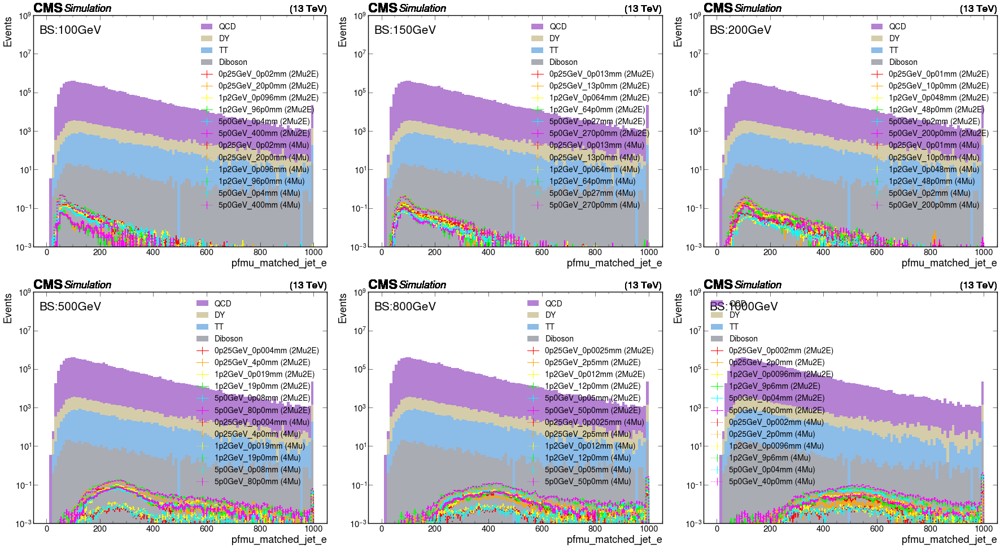

In [61]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="pfmu_matched_jet_e",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)


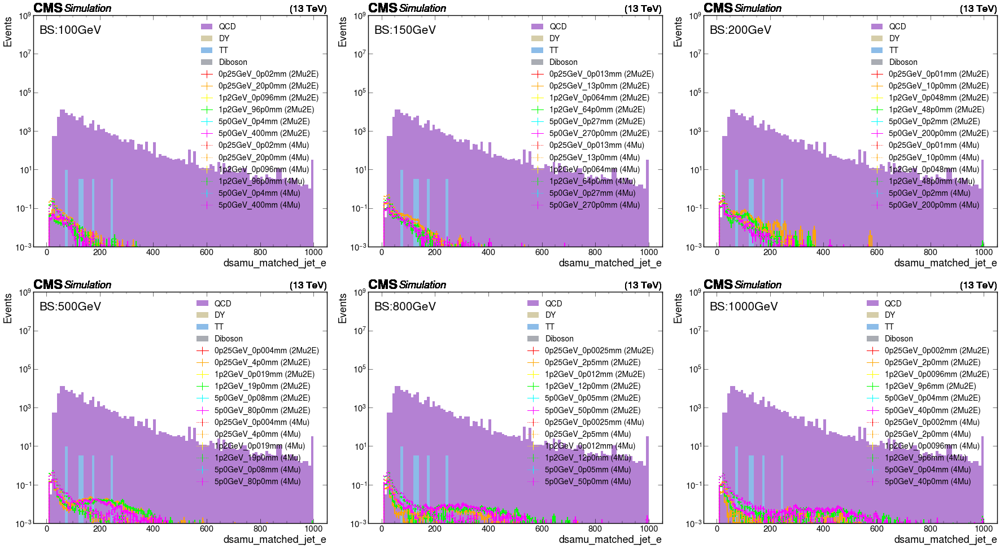

In [62]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="dsamu_matched_jet_e",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

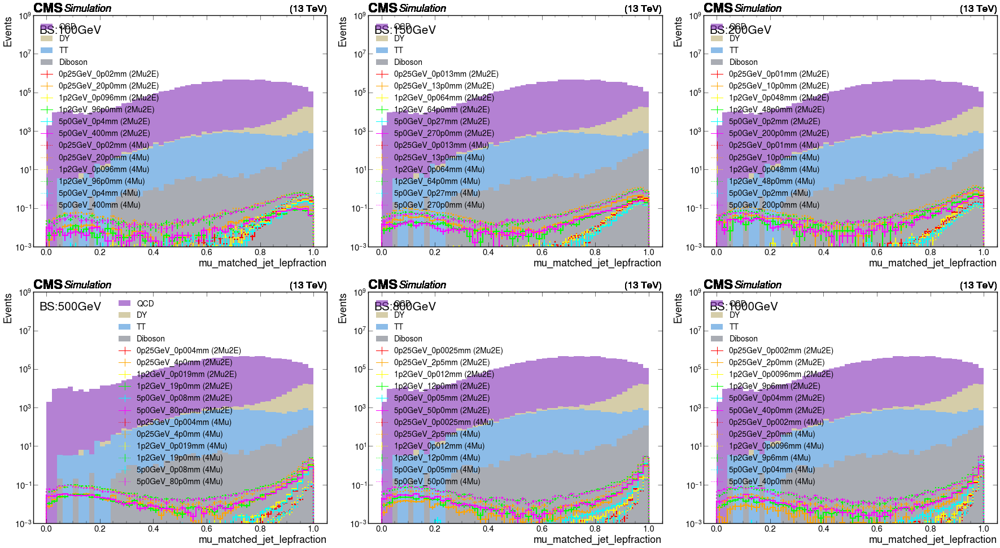

In [63]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="mu_matched_jet_lepfraction",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

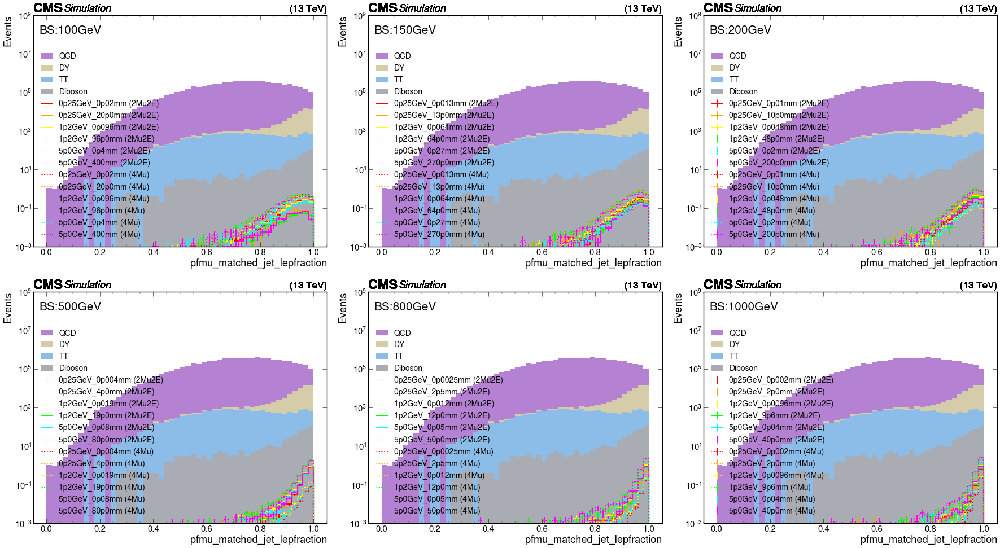

In [64]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="pfmu_matched_jet_lepfraction",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)


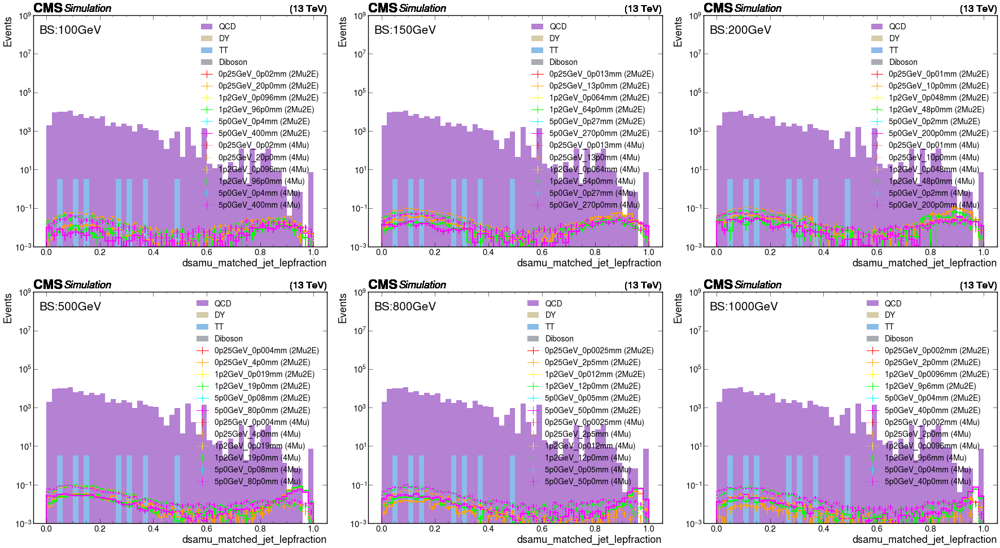

In [65]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="dsamu_matched_jet_lepfraction",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

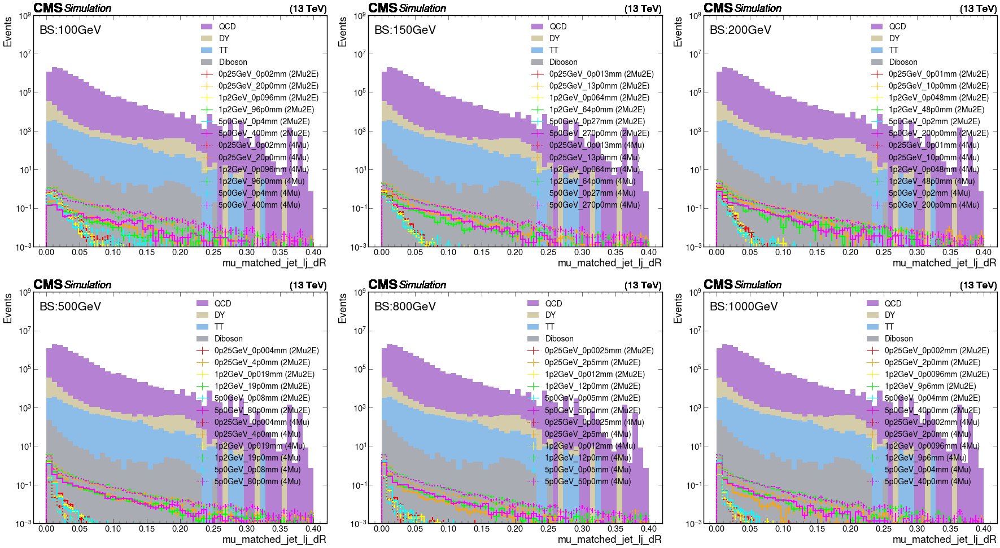

In [66]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="mu_matched_jet_lj_dR",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

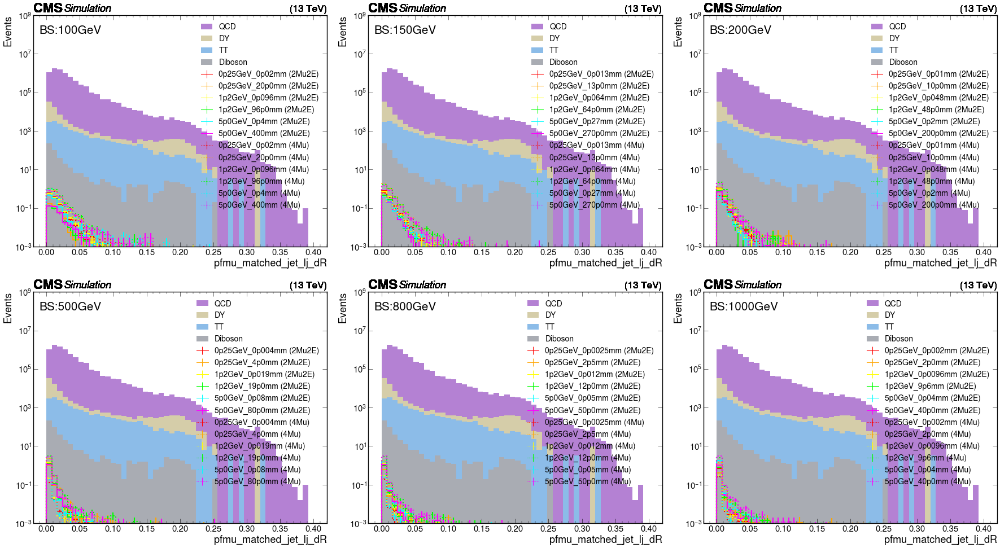

In [67]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="pfmu_matched_jet_lj_dR",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)


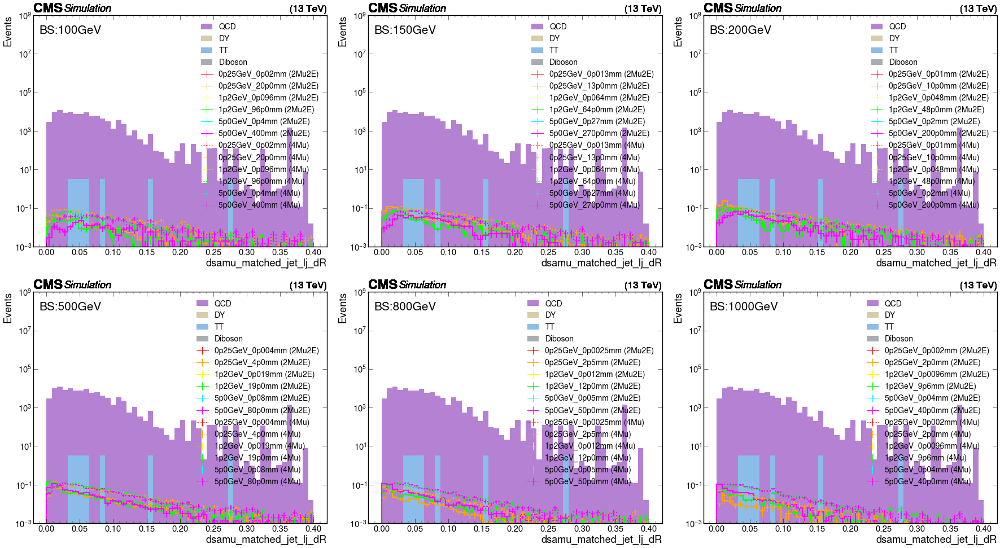

In [68]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="dsamu_matched_jet_lj_dR",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

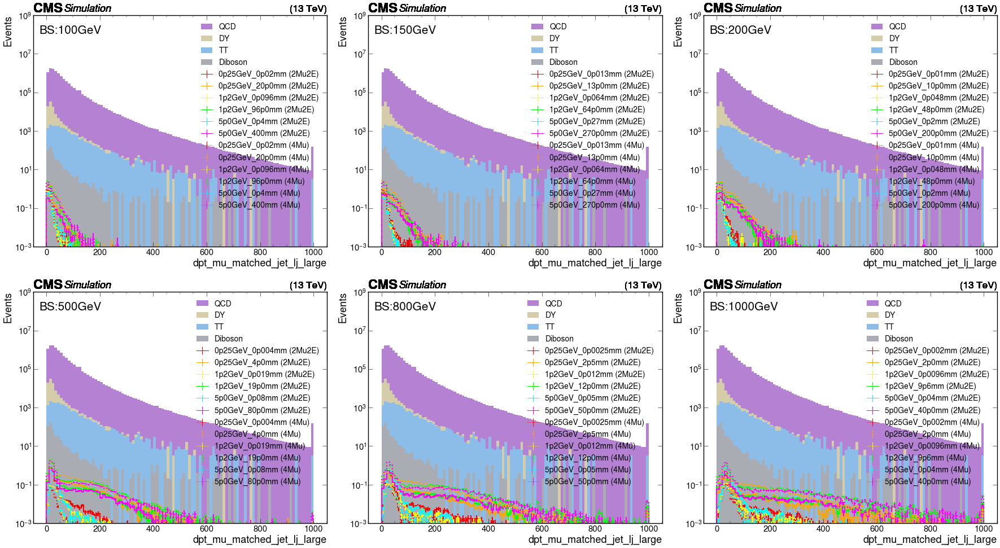

In [69]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="dpt_mu_matched_jet_lj_large",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

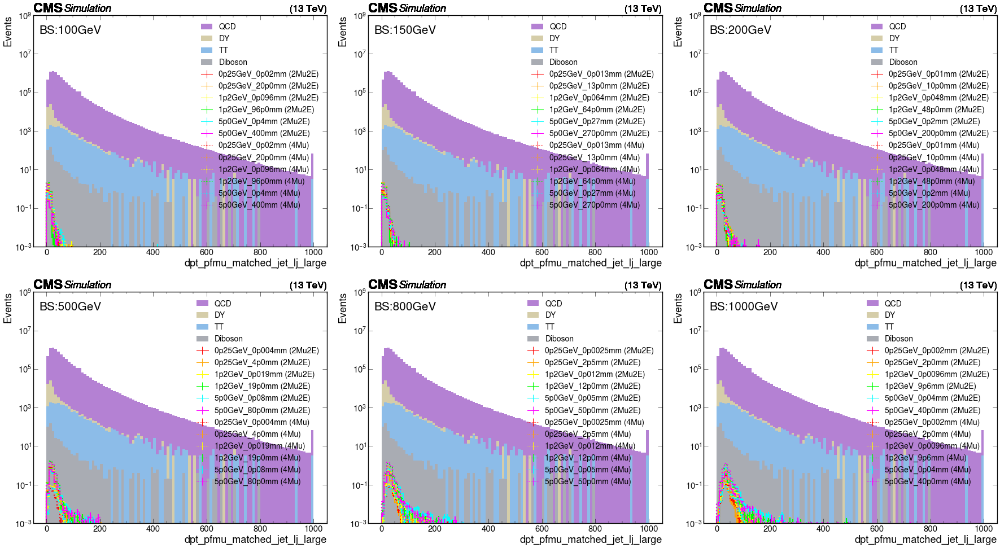

In [70]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="dpt_pfmu_matched_jet_lj_large",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)


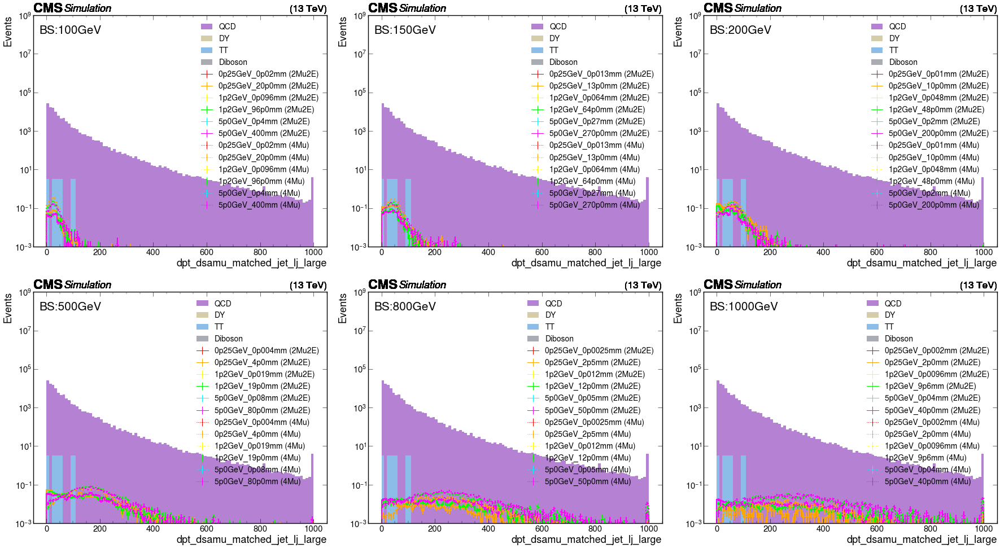

In [71]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="dpt_dsamu_matched_jet_lj_large",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

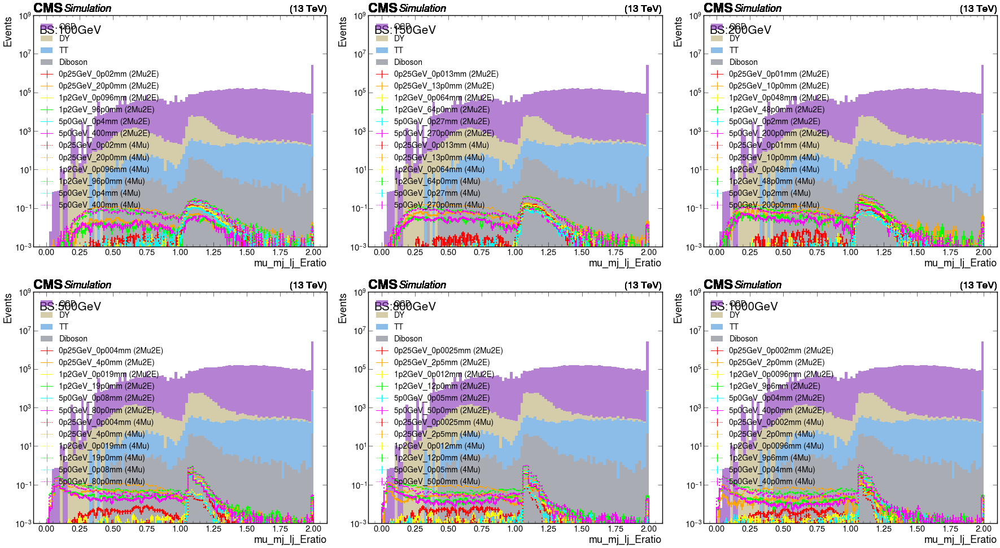

In [72]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="mu_mj_lj_Eratio",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

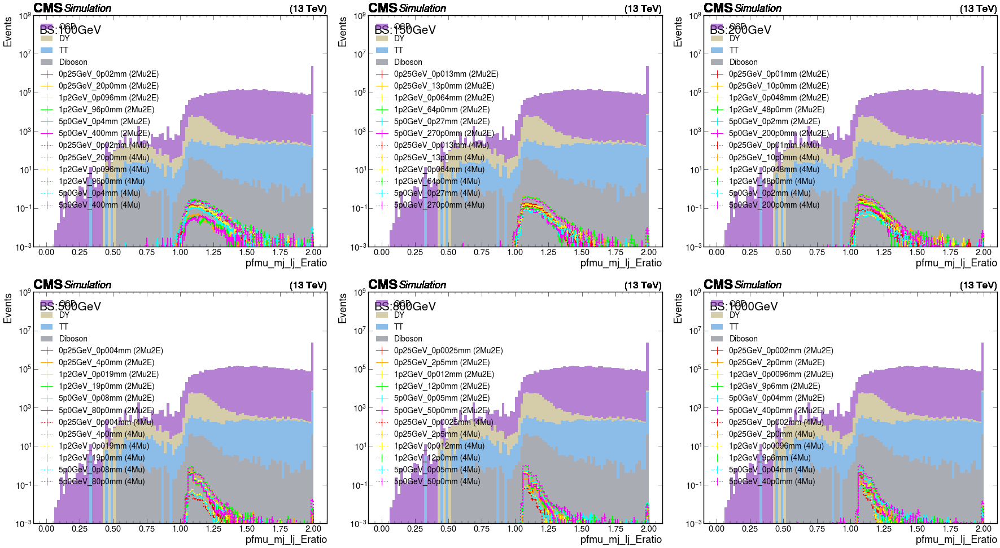

In [73]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="pfmu_mj_lj_Eratio",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)


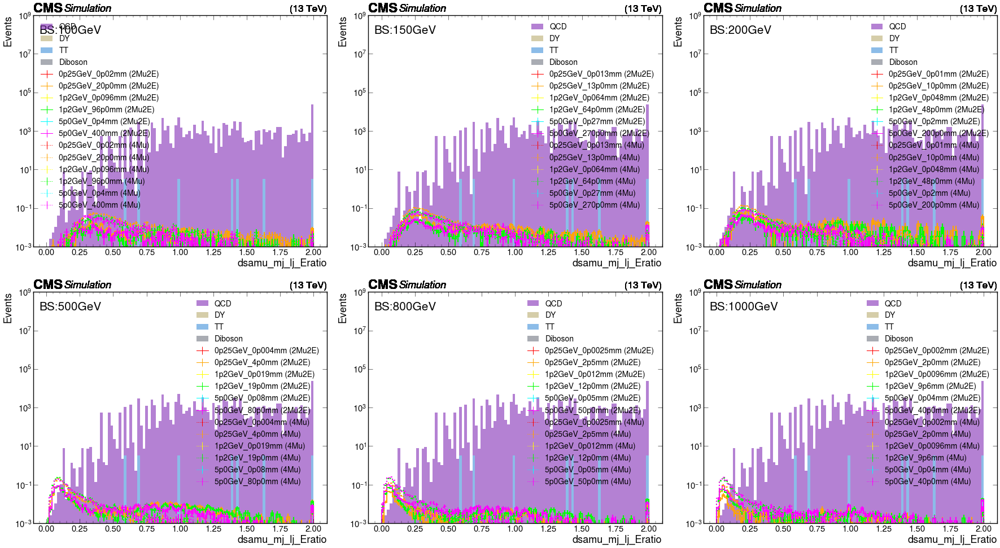

In [75]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channel_1mu,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="dsamu_mj_lj_Eratio",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)